# City of Toronto Bicycle Collisions Data

This dataset provides detailed information on bicycle collisions that have occurred within the City of Toronto. It includes data on the location, time, and circumstances of each incident, offering valuable insights into patterns and trends related to bicycle safety. By analyzing this data, we can better understand the factors contributing to bicycle collisions and identify areas where improvements in infrastructure or safety measures may be needed. 

## Setup Notebook

In [3]:
# Import 3rd party libraries
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pylab as plt
import geopandas as gpd
import folium
from IPython.display import display
from shapely.geometry import Point

# Configure Notebook
%matplotlib inline
plt.style.use('fivethirtyeight')
sns.set_context("notebook")
import warnings
warnings.filterwarnings('ignore')

## Import GeoJson Data

To begin analyzing bicycle collision data, we first need to load the dataset. The data is stored in GeoJSON format, which contains geographical information that can be processed using a GeoDataFrame in the geopandas library. This is a large data file and would have to be imported from a separate file path. 

Below, we import the dataset and display the first few rows to get an overview of the data structure:

In [6]:
# Load the dataset from the specified path and read it as a GeoDataFrame
# The dataset contains traffic collision data in GeoJSON format, which includes geospatial information
collision_data = gpd.read_file('../../../data_files/Traffic_Collisions_Open_Data.geojson')

# View GeoDataFrame
collision_data.head()

,OBJECTID,EVENT_UNIQUE_ID,OCC_DATE,OCC_MONTH,OCC_DOW,OCC_YEAR,OCC_HOUR,DIVISION,FATALITIES,INJURY_COLLISIONS,...,HOOD_158,NEIGHBOURHOOD_158,LONG_WGS84,LAT_WGS84,AUTOMOBILE,MOTORCYCLE,PASSENGER,BICYCLE,PEDESTRIAN,geometry
0,1,GO-20148000005,"Wed, 01 Jan 2014 05:00:00 GMT",January,Wednesday,2014,13,D23,0,NO,...,006,Kingsview Village-The Westway (6),-79.558639,43.694246,YES,NO,NO,NO,NO,POINT (-79.55864 43.69425)
1,2,GO-20148000085,"Wed, 01 Jan 2014 05:00:00 GMT",January,Wednesday,2014,19,D42,0,NO,...,128,Agincourt South-Malvern West (128),-79.281506,43.784746,YES,NO,NO,NO,NO,POINT (-79.28151 43.78475)
2,3,GO-20141260499,"Wed, 01 Jan 2014 05:00:00 GMT",January,Wednesday,2014,2,NSA,0,YES,...,NSA,NSA,0.000000,0.000000,YES,NO,NO,NO,NO,POINT (0 0)
3,4,GO-20141260663,"Wed, 01 Jan 2014 05:00:00 GMT",January,Wednesday,2014,3,NSA,0,NO,...,NSA,NSA,0.000000,0.000000,YES,NO,NO,NO,NO,POINT (0 0)
4,5,GO-20141261162,"Wed, 01 Jan 2014 05:00:00 GMT",January,Wednesday,2014,5,NSA,0,YES,...,NSA,NSA,0.000000,0.000000,YES,NO,NO,NO,NO,POINT (0 0)


## Data Analysis

Let's explore the features within the collisions dataset.

In [9]:
# Check the number of columns and rows
collision_data.shape

(704704, 22)

In [10]:
# Check the columns in GeoDataFrame
collision_data.columns

Index(['OBJECTID', 'EVENT_UNIQUE_ID', 'OCC_DATE', 'OCC_MONTH', 'OCC_DOW',
       'OCC_YEAR', 'OCC_HOUR', 'DIVISION', 'FATALITIES', 'INJURY_COLLISIONS',
       'FTR_COLLISIONS', 'PD_COLLISIONS', 'HOOD_158', 'NEIGHBOURHOOD_158',
       'LONG_WGS84', 'LAT_WGS84', 'AUTOMOBILE', 'MOTORCYCLE', 'PASSENGER',
       'BICYCLE', 'PEDESTRIAN', 'geometry'],
      dtype='object')

Based on the Toronto Police Service's Traffic Collisions Open Data, here is a description of each column in the dataset:

- OBJECTID: A unique identifier for each collision record.
- EVENT_UNIQUE_ID: A unique code assigned to each specific event.
- OCC_DATE: The date and time of the collision occurrence.
- OCC_MONTH: The month in which the collision occurred.
- OCC_DOW: The day of the week on which the collision happened.
- OCC_YEAR: The year in which the collision occurred.
- OCC_HOUR: The hour of the day (24-hour format) when the collision took place.
- DIVISION: The division code where the incident was recorded.
- FATALITIES: The number of fatalities resulting from the collision.
- INJURY_COLLISIONS: Indicates whether the collision involved injuries (e.g., "YES" or "NO").
- FTR_COLLISIONS: Indicates whether the collision was a "Fail to Remain" incident.
- PD_COLLISIONS: Indicates whether the collision involved property damage.
- HOOD_158: Numeric code representing the neighborhood where the collision occurred.
- NEIGHBOURHOOD_158: The name of the neighborhood and its associated number.
- LONG_WGS84: Longitude of the collision location (in WGS84 coordinate system).
- LAT_WGS84: Latitude of the collision location (in WGS84 coordinate system).
- AUTOMOBILE: Indicates if an automobile was involved in the collision (e.g., "YES" or "NO").
- MOTORCYCLE: Indicates if a motorcycle was involved in the collision.
- PASSENGER: Indicates if a passenger vehicle was involved in the collision.
- BICYCLE: Indicates if a bicycle was involved in the collision.
- PEDESTRIAN: Indicates if a pedestrian was involved in the collision.
- geometry: A spatial coordinate (likely projected coordinate system) for mapping the location.


In [12]:
# Check data types per column
print(collision_data.dtypes)

OBJECTID                int32
EVENT_UNIQUE_ID        object
OCC_DATE               object
OCC_MONTH              object
OCC_DOW                object
OCC_YEAR               object
OCC_HOUR               object
DIVISION               object
FATALITIES              int32
INJURY_COLLISIONS      object
FTR_COLLISIONS         object
PD_COLLISIONS          object
HOOD_158               object
NEIGHBOURHOOD_158      object
LONG_WGS84            float64
LAT_WGS84             float64
AUTOMOBILE             object
MOTORCYCLE             object
PASSENGER              object
BICYCLE                object
PEDESTRIAN             object
geometry             geometry
dtype: object


In [13]:
# Check numerical statistics for each column
collision_data.describe()

,OBJECTID,FATALITIES,LONG_WGS84,LAT_WGS84
count,704704.000000,704704.000000,704704.000000,704704.000000
mean,352352.500000,0.000873,-66.342691,36.528215
std,203430.666387,0.030053,29.423231,16.200397
min,1.000000,0.000000,-79.639247,0.000000
25%,176176.750000,0.000000,-79.444829,43.644346
50%,352352.500000,0.000000,-79.370469,43.692500
75%,528528.250000,0.000000,-79.258521,43.751480
max,704704.000000,3.000000,0.000000,43.853164


In this step, we are dropping all columns from the dataset except for those that are directly relevant to bicycle collisions. This is done to streamline the data and focus specifically on the information that pertains to bicycle-related incidents, which allows for more targeted analysis. By removing unnecessary columns, we reduce complexity and ensure that subsequent steps in data processing and analysis are more efficient and manageable.


In [15]:
# Drop columns
collision_data = collision_data.drop(columns=[
    'OBJECTID',               # Unique identifier, not informative for analysis
    'EVENT_UNIQUE_ID',        # Another unique identifier, redundant
    'HOOD_158',               # Numeric code for neighborhoods, redundant with neighborhood name
    'INJURY_COLLISIONS',      # Specific collision categories, may not fit broader analysis
    'NEIGHBOURHOOD_158',      # Redundant if detailed spatial analysis isn't required
    'OCC_MONTH',              # Month derivable from OCC_DATE
    'OCC_YEAR',               # Year derivable from OCC_DATE
    'OCC_DOW',                # Day of week derivable from OCC_DATE
    'DIVISION',               # Redundant for neighborhood-focused analysis
    'PASSENGER',              # Overlaps with automobile classification
    'AUTOMOBILE',             # May be less relevant if focusing on broader vehicle data
    'FATALITIES',             # May not fit broad collision trends
    'FTR_COLLISIONS',         # Specific collision subcategories
    'PD_COLLISIONS',          # Specific collision subcategories
    'MOTORCYCLE',             # May not fit focus of general collision analysis
    'PEDESTRIAN',             # May not fit focus of general collision analysis
], errors='ignore')

# Rename columns 
collision_data.rename(columns={
    'OCC_DATE': 'DATE',            # Rename to better indicate the data's purpose
    'LONG_WGS84': 'LONGITUDE',     # Simplify and clarify the name
    'LAT_WGS84': 'LATITUDE',       # Simplify and clarify the name
    'OCC_HOUR': 'HOUR'             # Rename for consistency
}, inplace=True)

# Check if columns are removed and remaining columns have been renamed
collision_data.columns

Index(['DATE', 'HOUR', 'LONGITUDE', 'LATITUDE', 'BICYCLE', 'geometry'], dtype='object')

## Data Cleaning

Data cleaning for the collision dataset ensures:

- Accuracy: Removes errors and inconsistencies.
- Efficiency: Streamlines the dataset for quicker and easier analysis.
- Reliability: Produces trustworthy insights and recommendations.
- Focus: Tailors the data for the specific analysis of collision patterns and trends.

This code below is used to convert the 'collision_date' column in the dataset into a datetime format. Converting the column ensures that the dates are in a standardized format that allows for easier manipulation and analysis (e.g., filtering by date, time-based grouping). The column name 'DATE' should be replaced with the actual name of the date column in your dataset if different.

In [18]:
# Convert the 'collision_date' column to datetime (replace 'collision_date' with the actual column name)
collision_data['DATE'] = pd.to_datetime(collision_data['DATE'])

# Verify the results 
collision_data.head()

,DATE,HOUR,LONGITUDE,LATITUDE,BICYCLE,geometry
0,2014-01-01 05:00:00,13,-79.558639,43.694246,NO,POINT (-79.55864 43.69425)
1,2014-01-01 05:00:00,19,-79.281506,43.784746,NO,POINT (-79.28151 43.78475)
2,2014-01-01 05:00:00,2,0.000000,0.000000,NO,POINT (0 0)
3,2014-01-01 05:00:00,3,0.000000,0.000000,NO,POINT (0 0)
4,2014-01-01 05:00:00,5,0.000000,0.000000,NO,POINT (0 0)


Before proceeding with any analysis, it's important to check the dataset for missing values. Missing or incomplete data can lead to inaccurate results or errors in processing. The following code will help us identify if there are any missing values in the traffic collision dataset and show the number of missing entries for each column:

In [20]:
# Check for missing values
print(collision_data.isnull().sum())

DATE         0
HOUR         0
LONGITUDE    0
LATITUDE     0
BICYCLE      4
geometry     0
dtype: int64


Oh no! There are 4 missing 'BICYCLE' enteries. This is very minor so we will just drop the null values. By calling dropna(), we ensure that only complete records are retained for analysis, which helps maintain the integrity of the dataset. After cleaning the data, we verify the result by checking for any remaining missing values using isnull().sum(). 

In [22]:
# Drop rows with any NaN values
collision_data = collision_data.dropna()

# Verify the results 
print(collision_data.isnull().sum())

DATE         0
HOUR         0
LONGITUDE    0
LATITUDE     0
BICYCLE      0
geometry     0
dtype: int64


Although we've removed all null (NaN) values, the dataset still contains placeholder values like '0', 'No', or 'N/R', which provide no useful information and are effectively equivalent to missing data. The following code will remove all rows where any column contains these values, ensuring that the dataset only includes meaningful entries for further analysis.

In [24]:
# Check uniqe values for BICYCLE column
collision_data['BICYCLE'].unique()

array(['NO', 'N/R', 'YES'], dtype=object)

In [25]:
# Drop rows where LONGITUDE or LATITUDE values are 0 or BICYCLE is 'NO' or 'N/R'
bike_collision_data = collision_data[
    (collision_data['LONGITUDE'] != 0) & 
    (collision_data['LATITUDE'] != 0) & 
    (collision_data['BICYCLE'] != 'NO') &
    (collision_data['BICYCLE'] != 'N/R')
]

# Verify the results by displaying the first few rows
bike_collision_data.head()

,DATE,HOUR,LONGITUDE,LATITUDE,BICYCLE,geometry
89,2014-01-02 05:00:00,18,-79.380272,43.648644,YES,POINT (-79.38027 43.64864)
351,2014-01-03 05:00:00,11,-79.399845,43.652539,YES,POINT (-79.39984 43.65254)
1857,2014-01-09 05:00:00,13,-79.405167,43.656966,YES,POINT (-79.40517 43.65697)
1891,2014-01-09 05:00:00,5,-79.480613,43.665578,YES,POINT (-79.48061 43.66558)
2271,2014-01-12 05:00:00,22,-79.377892,43.649143,YES,POINT (-79.37789 43.64914)


Now that we have dropped all unnecessary data, to get an overview of the size of the dataset, it's useful to check the number of rows and columns it contains.

In [27]:
# Check shape
bike_collision_data.shape

(10402, 6)

In [28]:
# Check for duplicates
bike_collision_data.duplicated().sum()

24

Initially, we planned to remove duplicates as part of the data cleaning process. However, it's not advisable to drop duplicates in this dataset because multiple collisions can occur at the same time or at the same geographical coordinates (longitude and latitude). To ensure the integrity of the data, we chose not to remove any duplicates. Removing these data points without careful consideration might undermine the depth and accuracy of the analysis, potentially overlooking critical patterns or impactful incidents.

In [30]:
# View GeoDataFrame
bike_collision_data.head()

,DATE,HOUR,LONGITUDE,LATITUDE,BICYCLE,geometry
89,2014-01-02 05:00:00,18,-79.380272,43.648644,YES,POINT (-79.38027 43.64864)
351,2014-01-03 05:00:00,11,-79.399845,43.652539,YES,POINT (-79.39984 43.65254)
1857,2014-01-09 05:00:00,13,-79.405167,43.656966,YES,POINT (-79.40517 43.65697)
1891,2014-01-09 05:00:00,5,-79.480613,43.665578,YES,POINT (-79.48061 43.66558)
2271,2014-01-12 05:00:00,22,-79.377892,43.649143,YES,POINT (-79.37789 43.64914)


## EDA

We will now create an interactive map visualizing bicycle collision locations in Toronto. The map is generated using the Folium library, which allows us to display geospatial data in a user-friendly format. Different colors represent different collision years. 

In [33]:
# Define Toronto's latitude and longitude
toronto_coords = [43.65107, -79.347015]

# Create a folium map centered on Toronto
map_collisions = folium.Map(location=toronto_coords, zoom_start=11)

# Define a color map for years
year_colors = {
    2014: 'cyan',
    2015: 'blue',
    2016: 'green',
    2017: 'red',
    2018: 'purple',
    2019: 'orange',
    2020: 'yellow',
    2021: 'pink',
    2022: 'black',
    2023: 'gray',
    2024: 'brown'
}

# Add each collision to the map
for _, row in bike_collision_data.iterrows():
    
    # Extract the year from the 'DATE' column
    year = pd.to_datetime(row['DATE']).year 
    
    # Get the color corresponding to the year
    color = year_colors.get(year)  

    folium.CircleMarker(
      location=[row['LATITUDE'], row['LONGITUDE']],  
      radius=1,  
      color=color,  
      fill=True,
      fill_color=color,  
      fill_opacity=0.6  
    ).add_to(map_collisions)

# Display the map
map_collisions

### Legend
The markers on the map are color-coded by the year of the collision:

- **Cyan**: 2014
- **Blue**: 2015
- **Green**: 2016
- **Red**: 2017
- **Purple**: 2018
- **Orange**: 2019
- **Yellow**: 2020
- **Pink**: 2021
- **Black**: 2022
- **Gray**: 2023
- **Brown**: 2024

## Temporal EDA

After converting the `DATE` column to a proper datetime format, we extracted several time-based attributes to analyze collision patterns more effectively. The following features were derived:

1. **Year**: The year in which the collision occurred.
2. **Month**: The month of the collision (1 = January, 12 = December).
3. **Day of the Week**: The name of the day (e.g., Monday, Tuesday).
4. **Hour**: The hour of the day when the collision occurred (0-23).

These features allow for temporal analysis of the data, such as identifying trends over years, seasonal patterns, or the most common days and hours for collisions. For example, examining collisions by the day of the week can help identify whether weekdays or weekends experience more accidents, while the hour attribute can reveal peak traffic or high-risk hours.


In [37]:
# Ensure the DATE column is in datetime format
bike_collision_data['DATE'] = pd.to_datetime(bike_collision_data['DATE'], errors='coerce')

# Extract year, month, and day of the week
bike_collision_data['YEAR'] = bike_collision_data['DATE'].dt.year
bike_collision_data['MONTH'] = bike_collision_data['DATE'].dt.month
bike_collision_data['DAY OF WEEK'] = bike_collision_data['DATE'].dt.day_name()

# Drop the time portion in the DATE column
bike_collision_data['DATE'] = bike_collision_data['DATE'].dt.date

# Reorder the columns
ordered_columns = ['DATE', 'HOUR', 'DAY OF WEEK', 'MONTH', 'YEAR', 'BICYCLE', 'LONGITUDE', 'LATITUDE', 'geometry']
bike_collision_data = bike_collision_data[ordered_columns]

# Convert the 'DATE' column to string 
bike_collision_data['DATE'] = bike_collision_data['DATE'].astype(str)

# Display the filtered GeoDataFrame
bike_collision_data.head()

,DATE,HOUR,DAY OF WEEK,MONTH,YEAR,BICYCLE,LONGITUDE,LATITUDE,geometry
89,2014-01-02,18,Thursday,1,2014,YES,-79.380272,43.648644,POINT (-79.38027 43.64864)
351,2014-01-03,11,Friday,1,2014,YES,-79.399845,43.652539,POINT (-79.39984 43.65254)
1857,2014-01-09,13,Thursday,1,2014,YES,-79.405167,43.656966,POINT (-79.40517 43.65697)
1891,2014-01-09,5,Thursday,1,2014,YES,-79.480613,43.665578,POINT (-79.48061 43.66558)
2271,2014-01-12,22,Sunday,1,2014,YES,-79.377892,43.649143,POINT (-79.37789 43.64914)


We will save the cleaned and filtered dataset containing only bicycle-related collisions into a new GeoJSON file for other notebooks to input. It will be saved in the clean data folder at the following path in the repository: CME538_Big-Project_Hackstreet-Boys/Clean Data.

In [39]:
# Export the GeoDataFrame to GeoJSON
output_path = "../../Clean Data/collision_data.geojson"
bike_collision_data.to_file(output_path, driver="GeoJSON")

### Yearly Collision Trends Analysis

The following plot visualizes the number of bicycle collisions in Toronto from 2014 to 2024. Using a bar plot, we can observe the yearly distribution of bicycle-related accidents. This graph highlights trends in collision frequency over time, which can provide insights into changes in bicycle safety, traffic patterns, or the impact of any safety initiatives implemented during this period. 

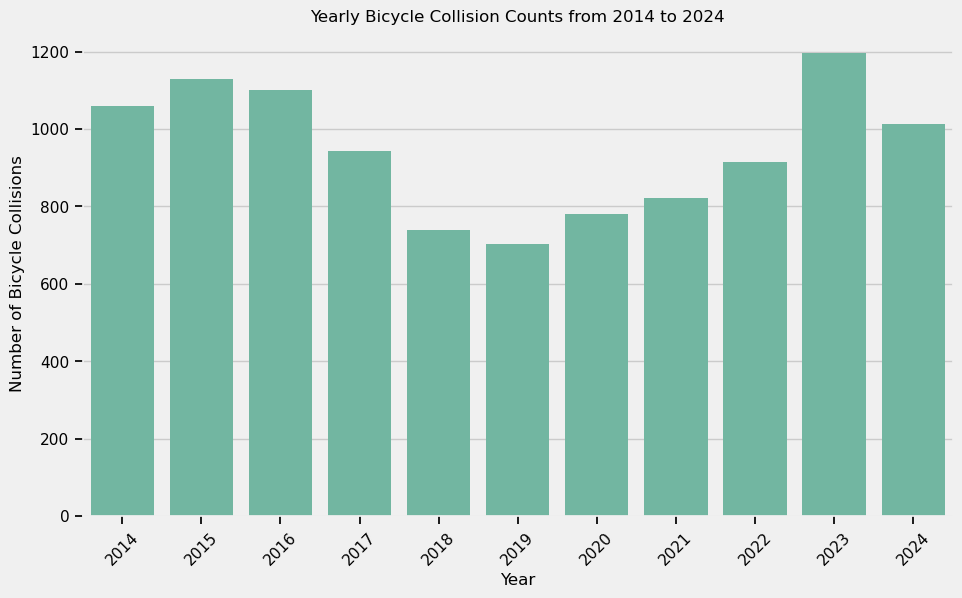

In [42]:
# Set a color palette 
sns.set_palette("Set2")

# Create the count plot for bicycle collisions by year
plt.figure(figsize=(10, 6))
sns.countplot(x='YEAR', data=bike_collision_data)

plt.title('Yearly Bicycle Collision Counts from 2014 to 2024')
plt.xlabel('Year')
plt.ylabel('Number of Bicycle Collisions')
plt.xticks(rotation=45)

plt.show()

### Relationship between Month and Year

The following line plot visualizes the trends in bicycle collisions over time, broken down by month, for the years 2014 to 2024. Each point represents the number of bicycle collisions that occurred in a specific month, with different lines corresponding to each year. This visualization provides valuable insights into how monthly collision rates have evolved over the past decade.

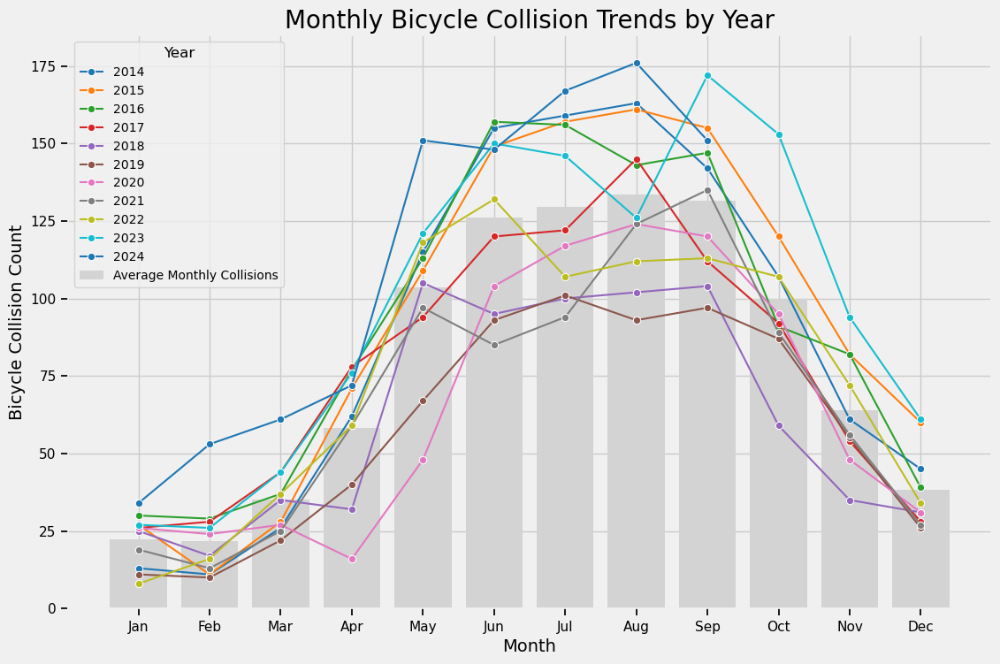

In [45]:
# Group data by YEAR and MONTH, and count collisions
monthly_collision_counts = bike_collision_data.groupby(['YEAR', 'MONTH']).size().reset_index(name='Bicycle_Collision_Count')

# Calculate the average monthly collision count across all years
average_monthly_collisions = monthly_collision_counts.groupby('MONTH')['Bicycle_Collision_Count'].mean().reset_index(name='Average_Collision_Count')

# Plot the bar plot for the average monthly collisions and lineplot for monthly collisions per year
plt.figure(figsize=(12, 8))

plt.bar(average_monthly_collisions['MONTH'], average_monthly_collisions['Average_Collision_Count'], 
        color='lightgray', label='Average Monthly Collisions')

sns.lineplot(
    data=monthly_collision_counts,
    x='MONTH',
    y='Bicycle_Collision_Count',
    hue='YEAR',
    marker='o',
    palette='tab10'  
)

plt.title("Monthly Bicycle Collision Trends by Year", fontsize=20)
plt.xlabel("Month", fontsize=14)
plt.ylabel("Bicycle Collision Count", fontsize=14)
plt.xticks(ticks=range(1, 13), labels=["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"])
plt.legend(title="Year", fontsize=10)

plt.show()

#### Relationship between Day of the Week and Month

The following heatmap visualizes the number of bicycle collisions by day of the week and month from 2014 to 2024. The data is organized into a pivot table that cross-references the days of the week with each month of the year, providing a clear overview of collision patterns throughout the year. This visualization helps to identify peak times for bicycle collisions, highlighting specific months or days of the week with higher accident rates, and can be useful for targeting safety interventions.

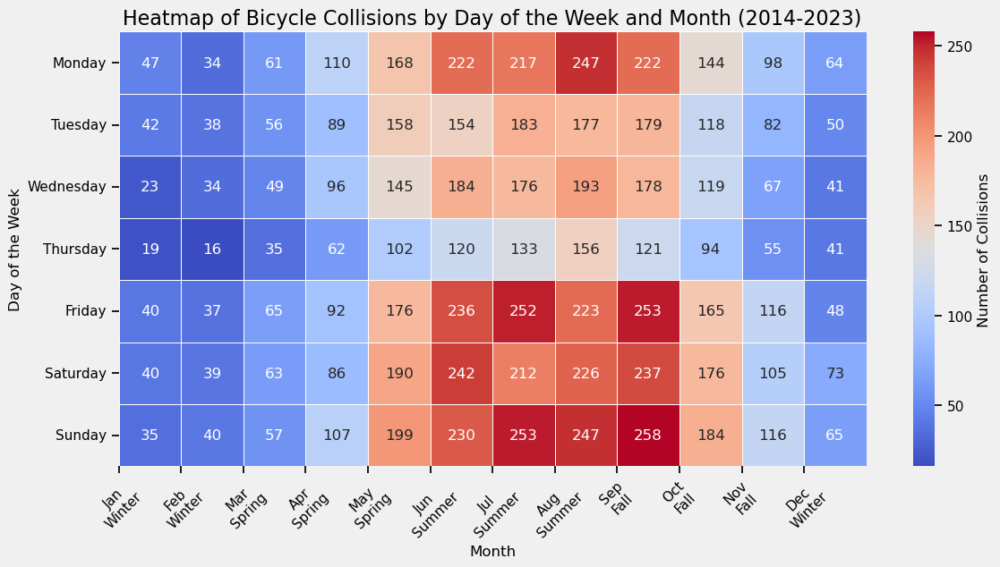

In [48]:
# Create a pivot table with counts of collisions by month and day of the week
collisions_pivot = bike_collision_data.pivot_table(index='DAY OF WEEK', columns='MONTH', aggfunc='size', fill_value=0)

# Reorder the days of the week to follow the traditional order
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
collisions_pivot.index = day_order

# Define months and their corresponding seasons
months = ["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"]
seasons = ["Winter", "Winter", "Spring", "Spring", "Spring", "Summer", "Summer", "Summer", "Fall", "Fall", "Fall", "Winter"]

# Set up color mapping for the seasons
season_colors = {
    "Winter": "#ADD8E6",  # Light blue for Winter
    "Spring": "#98FB98",  # Light green for Spring
    "Summer": "#FFD700",  # Gold for Summer
    "Fall": "#FF6347"     # Tomato red for Fall
}

# Create the heatmap
plt.figure(figsize=(12, 6))
sns.heatmap(collisions_pivot, annot=True, fmt='d', cmap='coolwarm', linewidths=0.5, cbar_kws={'label': 'Number of Collisions'})

plt.title('Heatmap of Bicycle Collisions by Day of the Week and Month (2014-2023)', fontsize=16)
plt.xlabel('Month', fontsize=12)
plt.ylabel('Day of the Week', fontsize=12)

# Update x-axis to include both month and season
plt.xticks(ticks=range(12), labels=[f"{month}\n{season}" for month, season in zip(months, seasons)], rotation=45)

# Display the plot
plt.show()

### Relationship between Time of Day and Day of the Week 

The following line graph visualizes the relationship between the time of day and the number of bicycle collisions across the days of the week, based on data from 2014 to 2024. The time of day is categorized into four distinct periods: Morning (5 AM - 12 PM), Afternoon (12 PM - 5 PM), Evening (5 PM - 9 PM), and Night (9 PM - 5 AM). Each line represents the number of collisions during one of these time periods, plotted across the days of the week. The graph helps to identify patterns in collision frequency, highlighting the times of day that are most associated with bicycle accidents on different days.

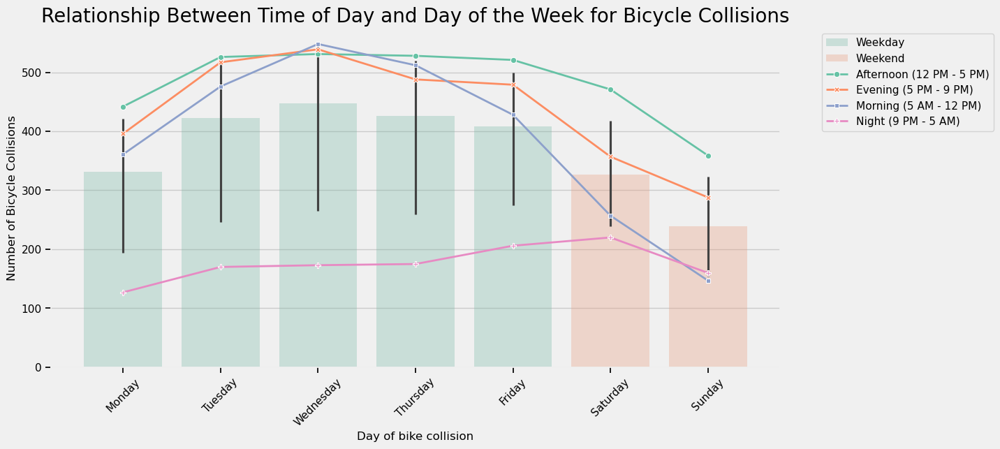

In [51]:
# Ensure HOUR column is in integer format 
bike_collision_data['HOUR'] = bike_collision_data['HOUR'].astype(int)

# Define time categories based on the hour of the day
def categorize_time(hour):
    if 5 <= hour < 12:
        return 'Morning (5 AM - 12 PM)'
    elif 12 <= hour < 17:
        return 'Afternoon (12 PM - 5 PM)'
    elif 17 <= hour < 21:
        return 'Evening (5 PM - 9 PM)'
    else:
        return 'Night (9 PM - 5 AM)'

# Apply the time categorization 
bike_collision_data['TIME OF DAY'] = bike_collision_data['HOUR'].apply(categorize_time)

# Group the data by DAY OF WEEK and TIME OF DAY and count the collisions
collisions_by_day_time = bike_collision_data.groupby(['DAY OF WEEK', 'TIME OF DAY']).size().reset_index(name='Bicycle_Collision_Count')

# Reorder days of the week
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
collisions_by_day_time['DAY OF WEEK'] = pd.Categorical(collisions_by_day_time['DAY OF WEEK'], categories=day_order, ordered=True)

# Create a new column to identify weekdays (Monday to Friday) and weekends (Saturday and Sunday)
collisions_by_day_time['Weekend'] = collisions_by_day_time['DAY OF WEEK'].apply(lambda x: 'Weekend' if x in ['Saturday', 'Sunday'] else 'Weekday')

# Pivot data for line plot
collisions_pivot = collisions_by_day_time.pivot(index='DAY OF WEEK', columns='TIME OF DAY', values='Bicycle_Collision_Count')

# Plot the faint bars for weekday/weekend collisions
plt.figure(figsize=(12, 6))
sns.barplot(data=collisions_by_day_time, x='DAY OF WEEK', y='Bicycle_Collision_Count', hue='Weekend', alpha=0.3)

# Overlay line plot for the time of day versus day of the week
sns.lineplot(data=collisions_pivot, markers=True, dashes=False, linewidth=2)

plt.title('Relationship Between Time of Day and Day of the Week for Bicycle Collisions', fontsize=20)
plt.xlabel('Day of bike collision', fontsize=12)
plt.ylabel('Number of Bicycle Collisions', fontsize=12)
plt.xticks(rotation=45)

# Move the legend to the side (outside the plot area)
plt.legend(bbox_to_anchor=(1.05, 1))

plt.show()

## Import Ward Data

To begin analyzing the geographic distribution of bicycle collisions, we will import ward data for the City of Toronto. This dataset contains the City of Toronto ward boundaries in the WGS84 coordinate system. It has already been cleaned and analyzed in a notebook at this path: CME538_Big-Project_Hackstreet-Boys/Datasets/Ward and District Data/Ward Data.ipynb. It is being imported from this path: CME538_Big-Project_Hackstreet-Boys/Clean Data/wards_data.geojson.

In [54]:
# Load the GeoJSON file generated 
ward_data = gpd.read_file('../../Clean Data/wards_data.geojson')  

# View GeoDataFrame
ward_data.head()

,WARD NUMBER,WARD NAME,WARD DISTRICT,geometry
0,01,Etobicoke North,Etobicoke York,"POLYGON ((614361.91 4846443.252, 614376.274 48..."
1,02,Etobicoke Centre,Etobicoke York,"POLYGON ((618769.981 4839786.381, 618770.007 4..."
2,03,Etobicoke-Lakeshore,Etobicoke York,"POLYGON ((621184.054 4834315.989, 621213.577 4..."
3,04,Parkdale-High Park,Toronto and East York,"POLYGON ((623660.782 4836061.188, 623724.263 4..."
4,05,York South-Weston,Etobicoke York,"POLYGON ((623361.036 4840391.392, 623364.743 4..."



Since the ward data has already been cleaned and analyzed, we only need to import it and correlate it with the collision data.

### Combine Collision and Ward Data Using Geospatial Relationships and Operations

To better understand the spatial distribution of bicycle collisions across Toronto, we will overlay the collision data onto the ward data. This process will allow us to visualize how collisions are distributed within the city's various wards, helping to identify areas with higher accident rates.

NOTE: an error occured when trying to conduct spatial operations on the geometry column. Therefore, Point has been imported from shapely.geometry to convert the latitude and longitude into a new geometry point.  

In [58]:
# Convert geometry column using Point
bike_collision_data["geometry"] = bike_collision_data.apply(lambda row: Point(row["LONGITUDE"], row["LATITUDE"]), axis=1)
bike_collision_data = gpd.GeoDataFrame(bike_collision_data, geometry="geometry", crs="EPSG:4326")

In [59]:
# Create a Folium map 
toronto_coords = [43.65107, -79.347015]
map_collisions_wards = folium.Map(location=toronto_coords, zoom_start=11)

# Add the ward boundaries to the map
folium.GeoJson(ward_data, 
               name="Wards"
              ).add_to(map_collisions_wards)

# Define a color map for years (you can adjust the color palette as needed)
year_colors = {
  2014: 'cyan',
  2015: 'blue',
  2016: 'green',
  2017: 'red',
  2018: 'purple',
  2019: 'orange',
  2020: 'yellow',
  2021: 'pink',
  2022: 'black',
  2023: 'gray',
  2024: 'brown'
}

# Add each collision to the map
for _, row in bike_collision_data.iterrows():
    
    # Extract the year from the 'DATE' column
    year = pd.to_datetime(row['DATE']).year  
    
    # Get the color corresponding to the year
    color = year_colors.get(year)  

    folium.CircleMarker(
      location=[row['LATITUDE'], row['LONGITUDE']],  
      radius=1,  
      color=color,  
      fill=True,
      fill_color=color, 
      fill_opacity=0.6  
    ).add_to(map_collisions_wards)

# Display map
map_collisions_wards

In [60]:
# Convert both to the same CRS (EPSG:4326)
ward_data = ward_data.to_crs(epsg=4326)
bike_collision_data = bike_collision_data.to_crs(epsg=4326)

# Perform spatial join to find which ward each collision occurred in
collision_with_wards = gpd.sjoin(bike_collision_data, ward_data, how="left", predicate="within")

# Drop unnecessary columns
collision_with_wards = collision_with_wards.drop(columns=["index_right"])

# Rename columns in the GeoDataFrame
collision_with_wards.rename(columns={
    'AREA_TYPE': 'Ward_Number',           
    'AREA_NAME': 'Ward_Name'
}, inplace=True)

# Display GeoDataFrame
collision_with_wards.head()  

,DATE,HOUR,DAY OF WEEK,MONTH,YEAR,BICYCLE,LONGITUDE,LATITUDE,geometry,TIME OF DAY,WARD NUMBER,WARD NAME,WARD DISTRICT
89,2014-01-02,18,Thursday,1,2014,YES,-79.380272,43.648644,POINT (-79.38027 43.64864),Evening (5 PM - 9 PM),13,Toronto Centre,Toronto and East York
351,2014-01-03,11,Friday,1,2014,YES,-79.399845,43.652539,POINT (-79.39984 43.65254),Morning (5 AM - 12 PM),10,Spadina-Fort York,Toronto and East York
1857,2014-01-09,13,Thursday,1,2014,YES,-79.405167,43.656966,POINT (-79.40517 43.65697),Afternoon (12 PM - 5 PM),11,University-Rosedale,Toronto and East York
1891,2014-01-09,5,Thursday,1,2014,YES,-79.480613,43.665578,POINT (-79.48061 43.66558),Morning (5 AM - 12 PM),04,Parkdale-High Park,Toronto and East York
2271,2014-01-12,22,Sunday,1,2014,YES,-79.377892,43.649143,POINT (-79.37789 43.64914),Night (9 PM - 5 AM),13,Toronto Centre,Toronto and East York


Let's send the geometrey column to the end. 

In [62]:
# Move geometry to the end
collision_with_wards = collision_with_wards[[col for col in collision_with_wards.columns if col != 'geometry'] + ['geometry']]

In [71]:
# Display GeoDataFrame
collision_with_wards.head()

,DATE,HOUR,DAY OF WEEK,MONTH,YEAR,BICYCLE,LONGITUDE,LATITUDE,TIME OF DAY,WARD NUMBER,WARD NAME,WARD DISTRICT,geometry
89,2014-01-02,18,Thursday,1,2014,YES,-79.380272,43.648644,Evening (5 PM - 9 PM),13,Toronto Centre,Toronto and East York,POINT (-79.38027 43.64864)
351,2014-01-03,11,Friday,1,2014,YES,-79.399845,43.652539,Morning (5 AM - 12 PM),10,Spadina-Fort York,Toronto and East York,POINT (-79.39984 43.65254)
1857,2014-01-09,13,Thursday,1,2014,YES,-79.405167,43.656966,Afternoon (12 PM - 5 PM),11,University-Rosedale,Toronto and East York,POINT (-79.40517 43.65697)
1891,2014-01-09,5,Thursday,1,2014,YES,-79.480613,43.665578,Morning (5 AM - 12 PM),04,Parkdale-High Park,Toronto and East York,POINT (-79.48061 43.66558)
2271,2014-01-12,22,Sunday,1,2014,YES,-79.377892,43.649143,Night (9 PM - 5 AM),13,Toronto Centre,Toronto and East York,POINT (-79.37789 43.64914)


We will export this dataset to be used in other notebooks. 

In [65]:
# Export the GeoDataFrame to GeoJSON
output_path = "../../Clean Data/collision_ward_data.geojson"
collision_with_wards.to_file(output_path, driver="GeoJSON")

## EDA


### Proportional Distribution of Bicycle Collisions by Ward District

This pie chart visualizes the distribution of bicycle collisions across different ward districts over the past decade. Each slice represents the total number of collisions for a particular ward, with the size of each slice corresponding to the relative proportion of incidents. The chart allows for a quick comparison of collision frequencies by district, helping to highlight areas with a higher or lower prevalence of bicycle-related accidents.

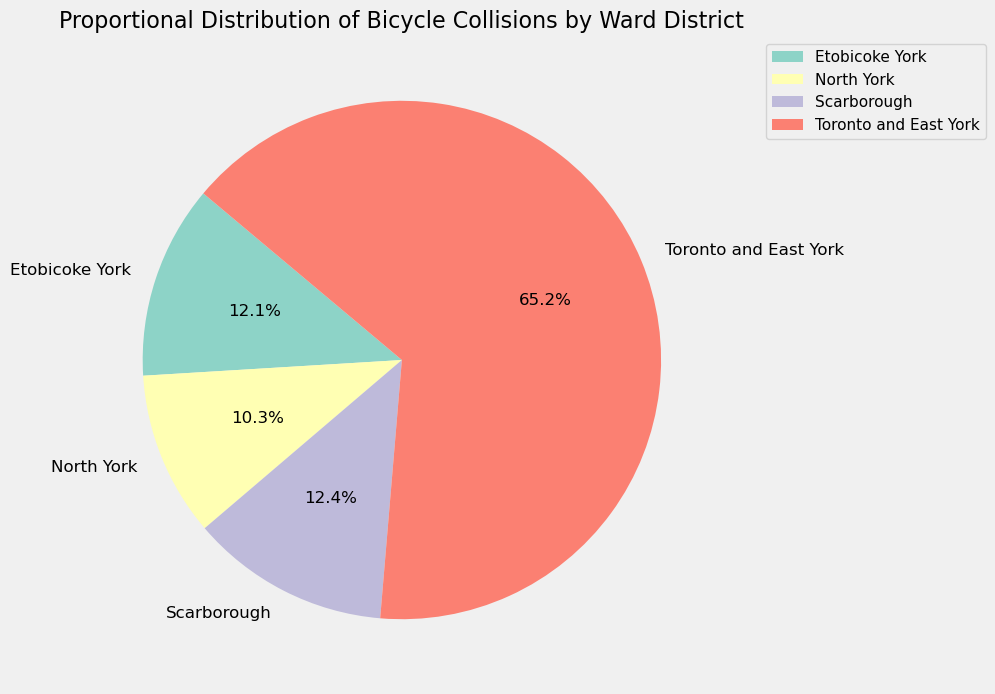

In [81]:
# Group by Ward District to get the total number of collisions across all years
collisions_by_district = collision_with_wards.groupby('WARD DISTRICT').size().reset_index(name='Number of Collisions')

# Set up a color palette 
import seaborn as sns
palette = sns.color_palette("Set3", len(collisions_by_district))

# Plotting the pie chart
plt.figure(figsize=(8, 8))
plt.pie(collisions_by_district['Number of Collisions'], 
        labels=collisions_by_district['WARD DISTRICT'], 
        autopct='%1.1f%%', 
        startangle=140, 
        colors=palette, 
        textprops={'fontsize': 12})

plt.title('Proportional Distribution of Bicycle Collisions by Ward District', fontsize=16)
plt.legend(collisions_by_district['WARD DISTRICT'], bbox_to_anchor=(1.05, 1))

plt.show()

### Bicycle Collisions Across Districts from 2014 to 2024

The following line graph visualizes the total number of bicycle collisions across various districts in Toronto from 2014 to 2024. Each district is represented by a distinct color, allowing for easy comparison of collision trends over time. By using unique colors for each district, this graph highlights how collision frequencies fluctuate from year to year across different areas of the city.

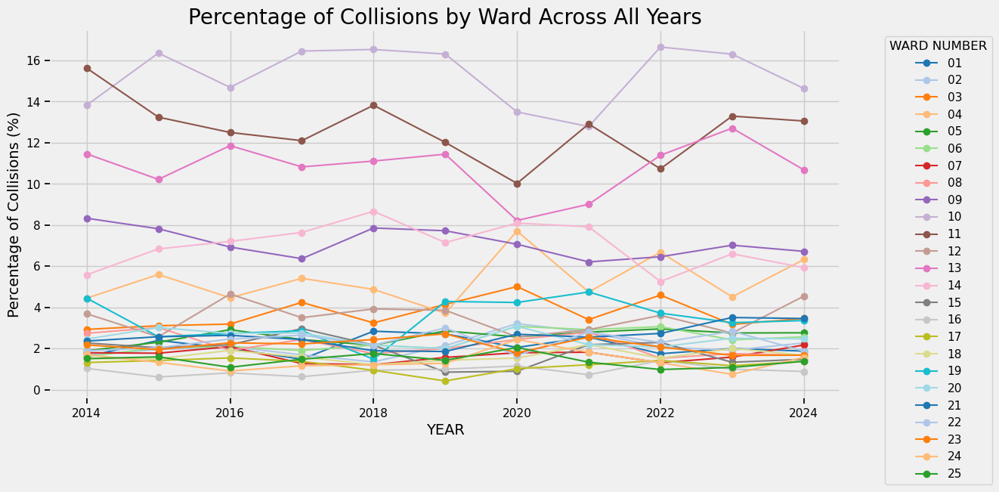

In [115]:
# Grouping by ward, ward name, and year for the total collision count across all years
ward_yearly_collisions = collision_with_wards.groupby(["WARD NUMBER", "WARD NAME", "YEAR"]).size().reset_index(name="Collisions")

# Calculate total collisions for each year across all wards
total_collisions_per_year = ward_yearly_collisions.groupby('YEAR')['Collisions'].sum().reset_index(name='Total_Collisions')

# Merge the total collisions with the ward data to calculate percent
ward_yearly_collisions = pd.merge(ward_yearly_collisions, total_collisions_per_year, on='YEAR')
ward_yearly_collisions['Percentage_of_Collisions'] = (ward_yearly_collisions['Collisions'] / ward_yearly_collisions['Total_Collisions']) * 100

# Generate a color palette
unique_colors = sns.color_palette("tab20", n_colors=len(ward_yearly_collisions['WARD NUMBER'].unique()))

# Plotting the line graph 
plt.figure(figsize=(12, 6))

for idx, ward in enumerate(ward_yearly_collisions['WARD NUMBER'].unique()):
    ward_data = ward_yearly_collisions[ward_yearly_collisions['WARD NUMBER'] == ward]
    plt.plot(ward_data['YEAR'], ward_data['Percentage_of_Collisions'], label=ward, color=unique_colors[idx], marker='o')

plt.title("Percentage of Collisions by Ward Across All Years", fontsize=20)
plt.xlabel("YEAR", fontsize=14)
plt.ylabel("Percentage of Collisions (%)", fontsize=14)

plt.legend(title="WARD NUMBER", bbox_to_anchor=(1.05, 1))
plt.show()

### Collisions across all Districts every month from 2014 to 2024

This line graph visualizes the percentage of bicycle collisions that occurred in each ward district on a monthly basis, spanning from 2014 to 2024. The plot is useful for understanding seasonal trends and identifying which months have higher collision rates in specific wards, aiding in targeted safety initiatives.

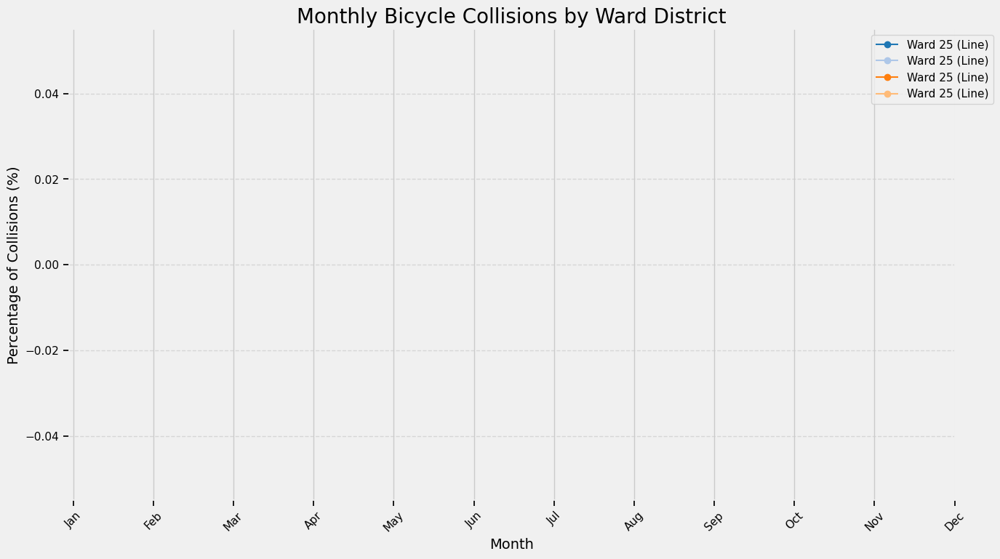

In [130]:
# Group by Ward District and Month to get the total number of collisions across all years
monthly_collisions_by_ward = collision_with_wards.groupby(['WARD DISTRICT', 'MONTH']).size().reset_index(name='Number of Collisions')

# Calculate the total number of collisions for each month across all wards
total_collisions_per_month = monthly_collisions_by_ward.groupby('MONTH')['Number of Collisions'].sum().reset_index(name='Total_Collisions')

# Merge the total collisions with the monthly ward-level data to calculate percentage
monthly_collisions_by_ward = pd.merge(monthly_collisions_by_ward, total_collisions_per_month, on='MONTH')
monthly_collisions_by_ward['Percentage_of_Collisions'] = (monthly_collisions_by_ward['Number of Collisions'] / monthly_collisions_by_ward['Total_Collisions']) * 100

# Define months for the x-axis
months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

# Set up a color palette
ward_numbers = monthly_collisions_by_ward['WARD DISTRICT'].unique()
palette = sns.color_palette("tab20", len(ward_numbers))

# Plotting the line graph for percentage of collisions for each ward
plt.figure(figsize=(14, 8))

for i, distrct in enumerate(ward_numbers):
    ward_data = monthly_collisions_by_ward[monthly_collisions_by_ward['WARD DISTRICT'] == ward]
    plt.plot(ward_data['MONTH'] + i * 0.2, ward_data['Percentage_of_Collisions'], 
             marker='o', color=palette[i], label=f'Ward {ward} (Line)')


plt.title('Monthly Bicycle Collisions by Ward District', fontsize=20)
plt.xlabel('Month', fontsize=14)
plt.ylabel('Percentage of Collisions (%)', fontsize=14)
plt.xticks(ticks=range(12), labels=months, rotation=45)  
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.legend(bbox_to_anchor=(1.05, 1))
plt.show()

### Collisions Across all Ward Districts Day of the Week

This visualization shows the percentage of bicycle collisions by day of the week across different ward districts from 2014 to 2024. The x-axis reflects the days of the week (Monday to Sunday), while the y-axis shows the percentage of total collisions for each ward on those days. This plot helps identify patterns in collision frequency, such as whether certain days of the week, like weekends, see higher collision rates in specific wards.

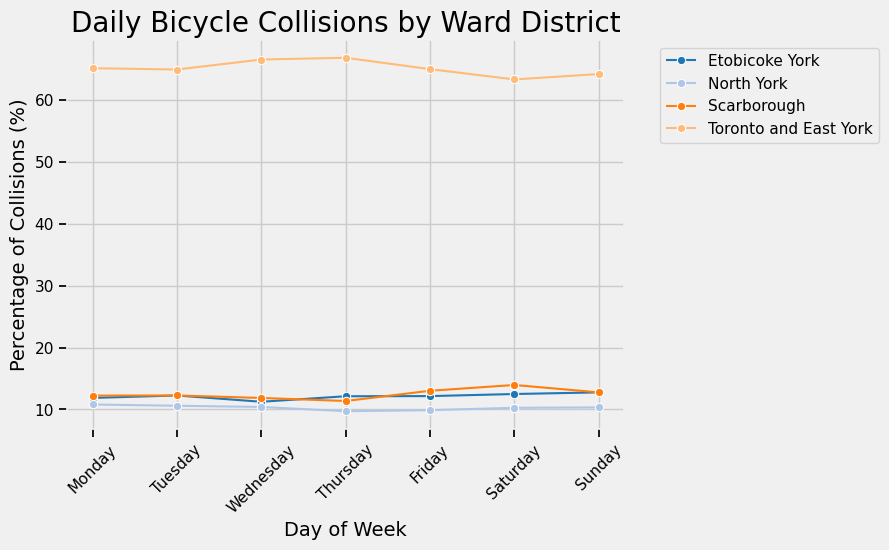

In [146]:
# Group by Ward District and Day of the Week to get the total number of collisions across all years
daily_collisions_by_ward = collision_with_wards.groupby(['WARD DISTRICT', 'DAY OF WEEK']).size().reset_index(name='Number of Collisions')

# Calculate the total number of collisions for each day of the week across all wards
total_collisions_per_day = daily_collisions_by_ward.groupby('DAY OF WEEK')['Number of Collisions'].sum().reset_index(name='Total_Collisions')

# Merge the total collisions with the ward data to calculate percent
daily_collisions_by_ward = pd.merge(daily_collisions_by_ward, total_collisions_per_day, on='DAY OF WEEK')
daily_collisions_by_ward['Percentage_of_Collisions'] = (daily_collisions_by_ward['Number of Collisions'] / daily_collisions_by_ward['Total_Collisions']) * 100

# Define the order of the days of the week 
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
day_to_num = {day: i for i, day in enumerate(day_order)}

# Convert Day of the Week from string to numeric value 
daily_collisions_by_ward['Day_num'] = daily_collisions_by_ward['DAY OF WEEK'].map(day_to_num)

# Set up a color palette 
ward_numbers = daily_collisions_by_ward['WARD DISTRICT'].unique()
palette = sns.color_palette("tab20", len(ward_numbers))

# Plotting the line graph for percentage of collisions for each ward
sns.lineplot(data=daily_collisions_by_ward, 
             x='Day_num', 
             y='Percentage_of_Collisions', 
             hue='WARD DISTRICT', 
             marker='o', 
             palette='tab20')


plt.title('Daily Bicycle Collisions by Ward District', fontsize=20)
plt.xlabel('Day of Week', fontsize=14)
plt.ylabel('Percentage of Collisions (%)', fontsize=14)
plt.xticks(ticks=range(7), labels=day_order, rotation=45) 

plt.legend(bbox_to_anchor=(1.05, 1))
plt.show()


### Collisions across all Ward Districts for Time of Day

This plot displays the percentage of bicycle collisions across various ward districts, categorized by different times of day, from 2014 to 2024. The time of day is broken down into four intervals: Morning (5 AM - 12 PM), Afternoon (12 PM - 5 PM), Evening (5 PM - 9 PM), and Night (9 PM - 5 AM). This analysis helps to highlight specific times of the day when collisions are more frequent in different areas, providing valuable insights for traffic safety and urban planning initiatives.

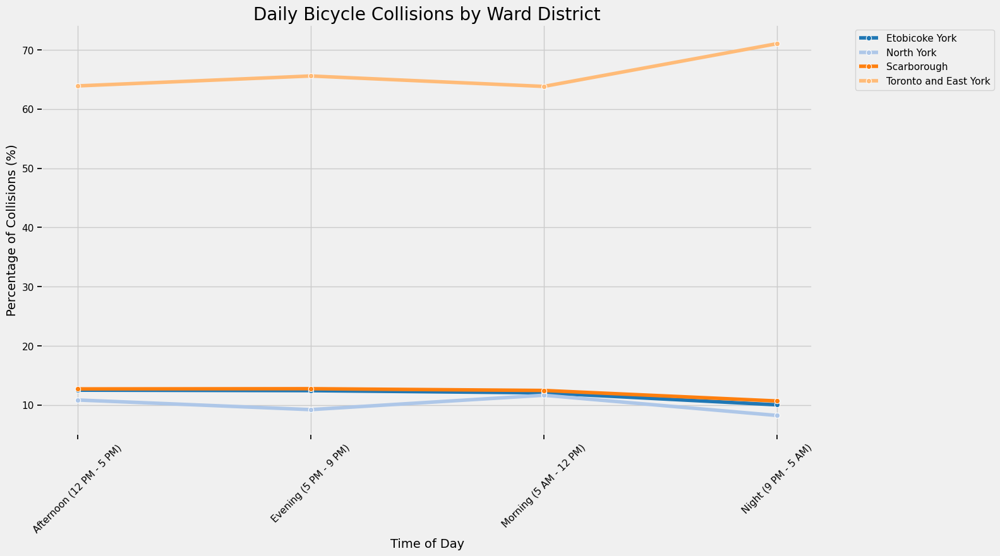

In [163]:
# Group by Ward District and Time of Day to get the total number of collisions across all years
collisions_by_ward_time = collision_with_wards.groupby(['WARD DISTRICT', 'TIME OF DAY']).size().reset_index(name='Number of Collisions')

# Calculate the total number of collisions for each time of the day across all wards
total_collisions_per_time = collisions_by_ward_time.groupby('TIME OF DAY')['Number of Collisions'].sum().reset_index(name='Total_Collisions')

# Merge the total collisions with the time of day ward-level data to calculate percentage
collisions_by_ward_time = pd.merge(collisions_by_ward_time, total_collisions_per_time, on='TIME OF DAY')
collisions_by_ward_time['Percentage_of_Collisions'] = (collisions_by_ward_time['Number of Collisions'] / collisions_by_ward_time['Total_Collisions']) * 100

# Convert 'TIME OF DAY' to numeric values 
# If 'TIME OF DAY' is categorical, you can map it to a numerical index or ensure it is treated as a string for categories
# Example of mapping categorical 'TIME OF DAY' to numbers:
time_of_day_to_num = {time: i for i, time in enumerate(collisions_by_ward_time['TIME OF DAY'].unique())}
collisions_by_ward_time['Time_num'] = collisions_by_ward_time['TIME OF DAY'].map(time_of_day_to_num)

# Set up a color palette w
ward_numbers = collisions_by_ward_time['WARD DISTRICT'].unique()
palette = sns.color_palette("tab20", len(ward_numbers))


# Plotting the line graph 
plt.figure(figsize=(14, 8))
sns.lineplot(data=collisions_by_ward_time, 
             x='Time_num', 
             y='Percentage_of_Collisions', 
             hue='WARD DISTRICT', 
             marker='o', 
             palette='tab20', 
             linewidth=4)

# Customize the plot
plt.title('Daily Bicycle Collisions by Ward District', fontsize=20)
plt.xlabel('Time of Day', fontsize=14)
plt.ylabel('Percentage of Collisions (%)', fontsize=14)

# Use the same labels for x-axis ticks based on the time of day
plt.xticks(ticks=range(len(time_of_day_to_num)), labels=list(time_of_day_to_num.keys()), rotation=45) 


plt.legend(bbox_to_anchor=(1.05, 1))
plt.show()
